In [1]:
import pandas as pd
import json
from haversine import haversine
import folium

In [2]:
market_2022 = pd.read_csv('./2022년 중형상권 이상.csv', encoding='EUC-KR')
market_2021 = pd.read_csv('./2021년 중형상권 이상.csv', encoding='EUC-KR')
market_2020 = pd.read_csv('./2020년 중형상권 이상.csv', encoding='EUC-KR')
market_2019 = pd.read_csv('./2019년 중형상권 이상.csv', encoding='EUC-KR')
market_anual_list =  [market_2019, market_2020, market_2021, market_2022] 

https://m.blog.naver.com/webkim/220695962486
# 매일 10만명의 유동인구 + 일매출10억이상

In [3]:
most_big_anual_list = []
big_anual_list = []
middle_anual_list = []

for i in range(len(market_anual_list)):
    most_big_market_region = market_anual_list[i].loc[(market_anual_list[i]['유동인구'] >= 100000)]
    most_big_market_region = most_big_market_region.loc[(most_big_market_region['분기당_매출_금액']/91) >= 1000000000]
    most_big_market_region["상권규모"] = "특대형상권"
    most_big_market_region = most_big_market_region.reset_index()
    most_big_anual_list.append(most_big_market_region)
    
for i in range(len(market_anual_list)):
    big_market_region = market_anual_list[i].loc[(market_anual_list[i]['유동인구'] < 100000)]
    big_market_region =  big_market_region.loc[(big_market_region['분기당_매출_금액']/91) > 1000000000]
    big_market_region["상권규모"] = "대형상권"
    big_market_region = big_market_region.reset_index()
    big_anual_list.append(big_market_region)    

for i in range(len(market_anual_list)):
    middle_market_region = market_anual_list[i].loc[(market_anual_list[i]['유동인구'] < 100000)]
    middle_market_region = middle_market_region.loc[(middle_market_region['분기당_매출_금액']/91) < 1000000000]
    middle_market_region["상권규모"] = "중형상권"
    middle_market_region = middle_market_region.sort_values(by='유동인구', ascending=False)
    middle_market_region = middle_market_region.head(100-len(most_big_anual_list[i])-len(big_anual_list[i])) 
    middle_market_region = middle_market_region.reset_index()
    middle_anual_list.append(middle_market_region)

# 지하철 노선도를 그리기 위한 코드
- 주제와 벗어나기 때문에 설명은 따로 하지 않겠습니다.
- 노선이 분기하는 경우 순환하는 경우 노선을 그리지 못합니다

In [4]:
location = pd.read_csv('./metro_2022_10_location.csv', encoding='EUC-KR')
location = location.drop(['사용월',  '출근시간(04~09) 승차', '출근시간(07~10) 하차', '퇴근시간(16~20) 승차', '퇴근시간(17~21) 하차'
                         , '점심시간', '저녁시간', '늦은시간퇴근(20~02) 승차', '총 승차 인원',  '총 하차 인원', '월', '연도'], axis=1)
location.rename(columns={location.columns[0]: "0"}, inplace=True)
location = location.drop(['0'], axis=1)

list_df = pd.DataFrame(location['호선명'].value_counts())
list_df = list_df.reset_index()
list_df_list = list_df['index'].to_list()

sub_list = []
for i in list_df_list:
    sub_list.append(location[location['호선명'].isin([i])])
    
for i in range(len(list_df)):
    sub_list[i] = sub_list[i].reset_index()
    sub_list[i] = sub_list[i].reset_index()

color_list = [ 'purple' , 'green'  , 'lightgreen' ,  'gray' , 'Orange',  
                 'beige' , 'blue ', 'skyblue',  'lightblue' , 
                    'lightblue' ,  'pink', 'yellow', 'cadetblue' ,
                 'skyblue', 'darkblue' , 'skyblue', 'blue' ]

sub_list_sort = []
for i in list_df_list:
    sub_list_sort.append(sub_list[0][sub_list[0]['level_0'].isin([999999])])

for i in range(len(sub_list)):
    su = 0
    su_list = []
    su_list.append(0)
    count = 0

    sel = 1

    while True:
        list_temp = []
        start =  [sub_list[i]['lat'][su], sub_list[i]['lng'][su]]
        for j in range(len(sub_list[i])):
            if not(j in su_list):
                end =  [sub_list[i]['lat'][j], sub_list[i]['lng'][j]]
                a = haversine(start, end, unit = 'km')
                list_temp.append(a)
            else:
                list_temp.append(10)
        

        if min(list_temp) > 3:
            su = 0
            sel = 0
            count = count + 1 
            # 까치산 처럼 갈라지는 곳은 대응못함

        else:
            tmp = min(list_temp)
            index = list_temp.index(tmp)

            if sel == 1:
                sub_list_temp = sub_list[i][sub_list[i]['level_0'].isin([index])]
                sub_list_sort[i] = pd.concat([sub_list_sort[i] , sub_list_temp])

            elif sel == 0:
                sub_list_temp = sub_list[i][sub_list[i]['level_0'].isin([index])]
                sub_list_sort[i] = pd.concat([ sub_list_temp, sub_list_sort[i]])

            su_list.append(index)
            su = index
            
        if count == 2:
            break

        if len(su_list) == len(sub_list[i]):
            break

# 비상수술        
sub_list_sort[10] = pd.concat([sub_list[10][sub_list[10]["지하철역"].isin(["수서"])], sub_list_sort[10]])
sub_list_sort[10] = pd.concat([sub_list[10][sub_list[10]["지하철역"].isin(["복정"])], sub_list_sort[10]])

sub_1  = sub_list[6][sub_list[6]["지하철역"].isin(["구로"])]
sub_1 = pd.concat([sub_list[6][sub_list[6]["지하철역"].isin(["가산디지털단지"])], sub_1])
sub_1 = pd.concat([sub_list[6][sub_list[6]["지하철역"].isin(["독산"])], sub_1])
sub_1 = pd.concat([sub_list[6][sub_list[6]["지하철역"].isin(["금천구청"])], sub_1])
sub_list_sort.append(sub_1)


for i in range(len(sub_list_sort)):
    sub_list_sort[i] = sub_list_sort[i].drop(['level_0', 'index'], axis=1)
    sub_list_sort[i] = sub_list_sort[i].reset_index()
    sub_list_sort[i] = sub_list_sort[i].reset_index()




In [5]:
list_df_list

['5호선',
 '2호선',
 '7호선',
 '3호선',
 '6호선',
 '9호선',
 '1호선',
 '4호선',
 '경의중앙선',
 '경원선',
 '8호선',
 '분당선',
 '우이신설선',
 '신림선',
 '공항철도 1호선',
 '경춘선']

In [6]:
sub_list_sort[9]

,level_0,index,호선명,지하철역,lat,lng
0,0,14,경원선,망월사,37.709914,127.047455
1,1,15,경원선,도봉산,37.689313,127.046222
2,2,16,경원선,도봉,37.679563,127.045595
3,3,13,경원선,방학,37.667503,127.044273
4,4,3,경원선,창동,37.653166,127.047731
5,5,17,경원선,녹천,37.644799,127.051269
6,6,6,경원선,월계,37.633212,127.058831
7,7,18,경원선,광운대,37.623632,127.061835
8,8,11,경원선,석계,37.614805,127.065851
9,9,10,경원선,신이문,37.601854,127.067325


In [7]:
def make_subway_map(my_map):
    for each in range(len(sub_list_sort)):
        for i in range(len(sub_list_sort[each])):
            if  (i+1) != len(sub_list_sort[each]):
                start =  sub_list_sort[each]['lat'][i], sub_list_sort[each]['lng'][i] 
                end = sub_list_sort[each]['lat'][i+1], sub_list_sort[each]['lng'][i+1]


                location_data = [start, end]
                folium.PolyLine(locations=location_data, tooltip='Polyline', color=color_list[each]).add_to(my_map)

In [8]:
def gu_line(my_map):
    geo_path = './skorea_municipalities_geo_simple.json'
    geo_str = json.load(open(geo_path, encoding='utf-8'))

    my_map.choropleth(
        geo_data=geo_str,
        fill_color='PuRd',
        key_on="feature.id",
        fill_opacity=0,
        line_opacity=0.2,
        legend_name="구별 도로연장",
    )

    folium.GeoJson(
        geo_str,
        style_function = lambda x: {'fillColor':'#00000000',
                                    'color':'black',
                                    'weight' :'1.5'}
    ).add_to(my_map)

# 시작

market_anual_list = []
</br>
most_big_anual_list = []
</br>
big_anual_list = []
</br>
middle_anual_list = []

In [9]:
my_map_list = []

In [10]:
def make_market_region(most_big_anual_list, big_anual_list, middle_anual_list, my_map):
    for each in range(len(middle_anual_list)):
        marker_circle = folium.Circle([middle_anual_list['lat'][each], middle_anual_list['long'][each]],
                                           radius = 500,
                                            color = 'white',
                                            popup = middle_anual_list['상권_코드_명'][each],
                                            fill_color = 'beige'
                                           )
        marker_circle.add_to(my_map)

    for each in range(len(big_anual_list)):
        marker_circle = folium.Circle([big_anual_list['lat'][each], big_anual_list['long'][each]],
                                           radius = 500,
                                            color = 'orange',
                                            popup = big_anual_list['상권_코드_명'][each],
                                            fill_color = 'orange'
                                           )
        marker_circle.add_to(my_map)

    for each in range(len(most_big_anual_list)):
        marker_circle = folium.Circle([most_big_anual_list['lat'][each], most_big_anual_list['long'][each]],
                                           radius = 500,
                                            color = 'red',
                                            popup = middle_anual_list['상권_코드_명'][each],
                                            fill_color = 'red'
                                           )
        marker_circle.add_to(my_map)

In [11]:
for i in range(len(market_anual_list)):
    my_map = folium.Map(location=[37.5502, 126.982], zoom_start=11, title="Stamen Toner")
    gu_line(my_map)
    make_subway_map(my_map)
    make_market_region(most_big_anual_list[i], big_anual_list[i], middle_anual_list[i], my_map)    
    my_map_list.append(my_map)

C:\python\envs\opencv\lib\site-packages\folium\folium.py:407: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  warnings.warn(


# 2019년 10월 상위 100위 상권 
- 빨강 : 초대형상권  매일 10만명의 유동인구 + 일매출10억이상
- 주황 : 대형상권 매일 2만명이상의 유동인구 + 일매출 10억이상
- 흰색 : 중형상권 매일 2만명이상의 유동인구를 유동인구 순으로 정렬한 나머지

In [12]:
my_map_list[0]

# 2020년 10월 상위 100위 상권 
- 빨강 : 초대형상권  매일 10만명의 유동인구 + 일매출10억이상
- 주황 : 대형상권 매일 2만명이상의 유동인구 + 일매출 10억이상
- 흰색 : 중형상권 매일 2만명이상의 유동인구를 유동인구 순으로 정렬한 나머지

In [13]:
my_map_list[1]

# 2021년 10월 상위 100위 상권 
- 빨강 : 초대형상권  매일 10만명의 유동인구 + 일매출10억이상
- 주황 : 대형상권 매일 2만명이상의 유동인구 + 일매출 10억이상
- 흰색 : 중형상권 매일 2만명이상의 유동인구를 유동인구 순으로 정렬한 나머지

In [14]:
my_map_list[2]

# 2022년 10월 상위 100위 상권 
- 빨강 : 초대형상권  매일 10만명의 유동인구 + 일매출10억이상
- 주황 : 대형상권 매일 2만명이상의 유동인구 + 일매출 10억이상
- 흰색 : 중형상권 매일 2만명이상의 유동인구를 유동인구 순으로 정렬한 나머지

In [15]:
my_map_list[3]

# 2019~2022년까지 10월의 특대형 상권의 변화는?

In [16]:
import matplotlib.pyplot as plt
#import seaborn as sns
%matplotlib inline

most_big_anual_list = []



big_anual_list = []



middle_anual_list = []

In [17]:
middle_market_region_2022_visual = market_2022.loc[(market_2022['유동인구'] < 100000)]
middle_market_region_2022_visual = middle_market_region_2022_visual.loc[(middle_market_region_2022_visual['분기당_매출_금액']/91) < 1000000000]
middle_market_region_2021_visual = market_2021.loc[(market_2021['유동인구'] < 100000)]
middle_market_region_2021_visual = middle_market_region_2021_visual.loc[(middle_market_region_2021_visual['분기당_매출_금액']/91) < 1000000000]
middle_market_region_2020_visual = market_2020.loc[(market_2020['유동인구'] < 100000)]
middle_market_region_2020_visual = middle_market_region_2020_visual.loc[(middle_market_region_2020_visual['분기당_매출_금액']/91) < 1000000000]
middle_market_region_2019_visual = market_2019.loc[(market_2019['유동인구'] < 100000)]
middle_market_region_2019_visual = middle_market_region_2019_visual.loc[(middle_market_region_2019_visual['분기당_매출_금액']/91) < 1000000000]

In [19]:
market_count = pd.DataFrame({'초대형상권' : [len(most_big_anual_list[0]), len(most_big_anual_list[1]),
                                            len(most_big_anual_list[2]), len(most_big_anual_list[3])],
                             '대형상권' : [len(big_anual_list[0]), len(big_anual_list[1]),
                                          len(big_anual_list[2]), len(big_anual_list[3]),],
                             '중형상권' : [len(middle_anual_list[0]), len(middle_anual_list[1]),
                                          len(middle_anual_list[2]), len(middle_anual_list[3]),]
                            }, index = ["2019년", "2020년", "2021년", "2022년"])
market_count = market_count.reset_index() 
market_count['중형상권이상의 수'] = market_count['초대형상권'] +market_count['대형상권'] + market_count['중형상권']  

In [20]:
#윈도우
# matplotlib의 경우 한글폰트 깨짐현상을 방지하기 위한 코드
import matplotlib.pyplot as plt
%matplotlib inline

from matplotlib import font_manager, rc
plt.rcParams['axes.unicode_minus'] = False

f_path = "c:/Windows/Fonts/malgun.ttf"
font_name = font_manager.FontProperties(fname=f_path).get_name()
rc('font', family=font_name)

import seaborn as sns

'''
# <우분투용 한글 문제 해결 코드>
import matplotlib.pyplot as plt
plt.rc('font', family='NanumGothicCoding')
# Troubleshooting -마이너스가 깨질 경우가 있음. 이 경우 아래 코드 추가
import matplotlib as mpl
mpl.rcParams['axes.unicode_minus']=False
'''

"\n# <우분투용 한글 문제 해결 코드>\nimport matplotlib.pyplot as plt\nplt.rc('font', family='NanumGothicCoding')\n# Troubleshooting -마이너스가 깨질 경우가 있음. 이 경우 아래 코드 추가\nimport matplotlib as mpl\nmpl.rcParams['axes.unicode_minus']=False\n"

<AxesSubplot:xlabel='index'>

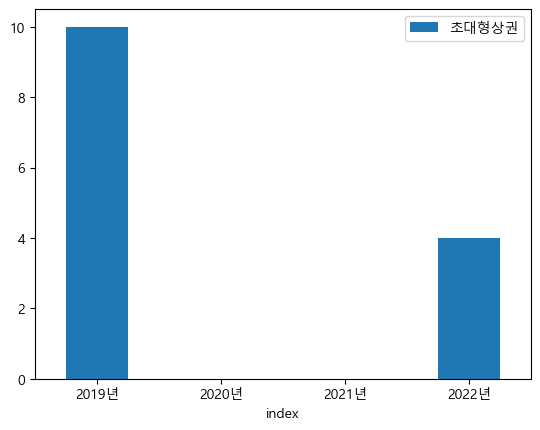

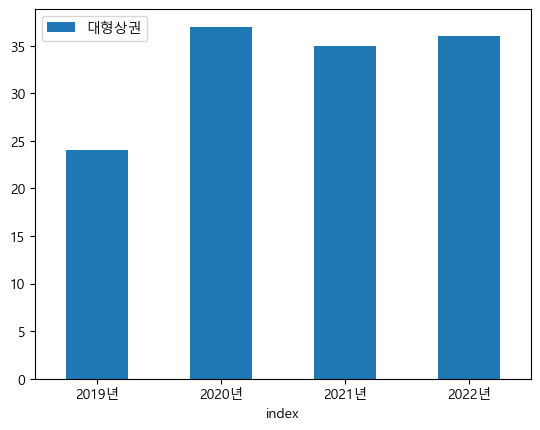

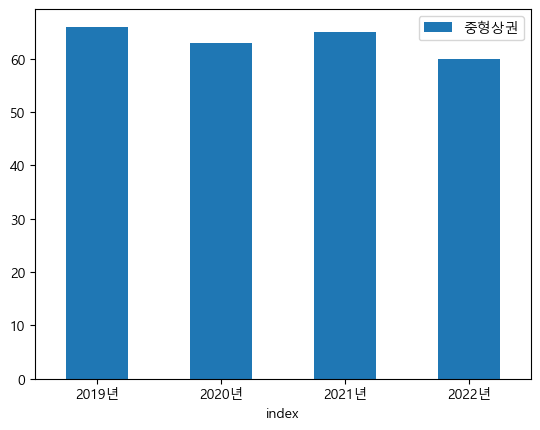

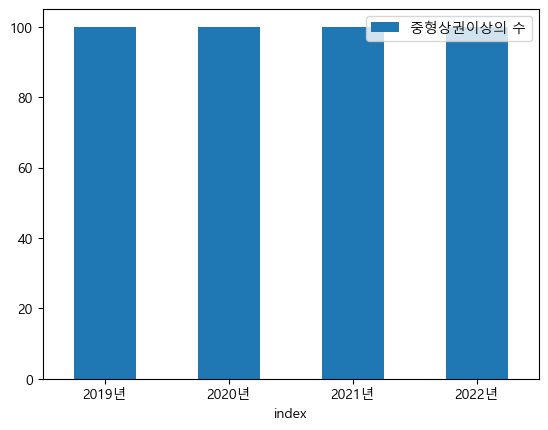

In [21]:
market_count.plot.bar(x='index',y='초대형상권',rot=0)
market_count.plot.bar(x='index',y='대형상권',rot=0)
market_count.plot.bar(x='index',y='중형상권',rot=0)
market_count.plot.bar(x='index',y='중형상권이상의 수',rot=0)

# 몇가지 확인해보고 싶은 것
## 2019년의 초대형 상권들이 전부 대형상권이 되버린 것일까?
## 2022년의 초대형 상권 중에서 2019년에 초대형 상권이였던 곳이 있나?

</br>
</br>
</br>


## 2019년의 초대형 상권들이 전부 대형상권이 되버린 것일까?

In [25]:
most_big_anual_list[0].head()

,index,상권_코드_명,점포_수,분기당_매출_금액,분기당_매출_건수,long,lat,유동인구,환승가능한버스노선,500m 버스정류장,환승가능지하철,500m 지하철역,상권규모
0,1,명동 남대문 북창동 다동 무교동 관광특구,8631,392306973005,16655824,126.981856,37.564149,138946.870968,9.555556,18,1.5,1,특대형상권
1,2,동대문패션타운 관광특구,13270,204760984791,6077340,127.011025,37.567312,107866.096774,5.473684,19,2.5,1,특대형상권
2,4,강남 마이스 관광특구,851,173926103805,4768635,127.060059,37.511003,101897.145161,5.818182,22,1.0,1,특대형상권
3,402,종각역,1834,133283055803,5696212,126.983496,37.570339,128279.516129,7.913043,23,1.0,1,특대형상권
4,423,명동(명동거리),2218,164980548089,8307033,126.984256,37.563230,124712.451613,8.500000,16,1.0,1,특대형상권


In [24]:
big_anual_list[1].head()

,index,상권_코드_명,점포_수,분기당_매출_금액,분기당_매출_건수,long,lat,유동인구,환승가능한버스노선,500m 버스정류장,환승가능지하철,500m 지하철역,상권규모
0,0,명동 남대문 북창동 다동 무교동 관광특구,8830,376621394364,14118041,126.981856,37.564149,86138.322581,11.157895,19,1.5,1,대형상권
1,1,동대문패션타운 관광특구,13382,246639327198,8631823,127.011025,37.567312,66338.096774,6.000000,19,2.5,1,대형상권
2,2,종로?청계 관광특구,5285,259239790301,7588063,126.997374,37.569998,49171.016129,5.560000,25,1.5,1,대형상권
3,3,강남 마이스 관광특구,889,167195866008,3957523,127.060059,37.511003,68574.983871,5.818182,22,1.0,1,대형상권
4,283,종각역,2210,122895242318,5386880,126.983496,37.570339,81576.612903,7.680000,25,1.0,1,대형상권


# 간단하게 확인해보자 folium 좌표로 찍어보고 2019년의 특대형 상권이 보인다면 성공이다.

In [28]:
my_map_test = folium.Map(location=[37.5502, 126.982], zoom_start=11, title="Stamen Toner")


for each in range(len(most_big_anual_list[0])):
    marker_circle = folium.Circle([most_big_anual_list[0]['lat'][each], most_big_anual_list[0]['long'][each]],
                                       radius = 500,
                                        color = 'red',
                                        popup = most_big_anual_list[0]['상권_코드_명'][each],
                                        fill_color = 'red'
                                       )
    marker_circle.add_to(my_map_test)
    
for each in range(len(big_anual_list[1])):
    marker_circle = folium.Circle([big_anual_list[1]['lat'][each], big_anual_list[1]['long'][each]],
                                       radius = 500,
                                        color = 'orange',
                                        popup = big_anual_list[1]['상권_코드_명'][each],
                                        fill_color = 'orange'
                                       )
    marker_circle.add_to(my_map_test)


my_map_test

### 고속터미널의 경우 2019년에 초대형상권에서 2020년에 중형상권으로 추락했다.


## 2022년의 초대형 상권 중에서 2019년에 초대형 상권이였던 곳이 있나?

In [32]:
my_map_test = folium.Map(location=[37.5502, 126.982], zoom_start=12, title="Stamen Toner")

for each in range(len(most_big_anual_list[0])):
    marker_circle = folium.Circle([most_big_anual_list[0]['lat'][each], most_big_anual_list[0]['long'][each]],
                                       radius = 500,
                                        color = 'orange',
                                        popup = most_big_anual_list[0]['상권_코드_명'][each],
                                        fill_color = 'orange'
                                       )
    marker_circle.add_to(my_map_test)
    
    
for each in range(len(most_big_anual_list[3])):
    marker_circle = folium.Circle([most_big_anual_list[3]['lat'][each], most_big_anual_list[3]['long'][each]],
                                       radius = 500,
                                        
                                        popup = most_big_anual_list[3]['상권_코드_명'][each],
                                       )
    marker_circle.add_to(my_map_test)

my_map_test

### 2022년 특대형 상권은 2019년의 특대형 상권과 일치했으며 새롭게 생긴 곳은 없다

# 그러면 2019년~2022년 10월의 중형상권 이상의 유동인구는 어떻게 변화하였는가?
- 무식하게 모든 연도별 모든 유동인구를 더해보자.

In [33]:
market_count = pd.DataFrame({'유동인구' : [market_2019["유동인구"].sum(), market_2020["유동인구"].sum(), market_2021["유동인구"].sum(),
                                           market_2022["유동인구"].sum()],
                             '중형상권의 수' : [len(market_2019["유동인구"]), len(market_2020["유동인구"]), len(market_2021["유동인구"]),
                                           len(market_2022["유동인구"])],
                             
                            }, index = ["2019년", "2020년", "2021년", "2022년"])
market_count = market_count.reset_index() 
market_count['중형상권 1곳당 유동 인구'] = market_count["유동인구"] / market_count["중형상권의 수"] 

<AxesSubplot:xlabel='index'>

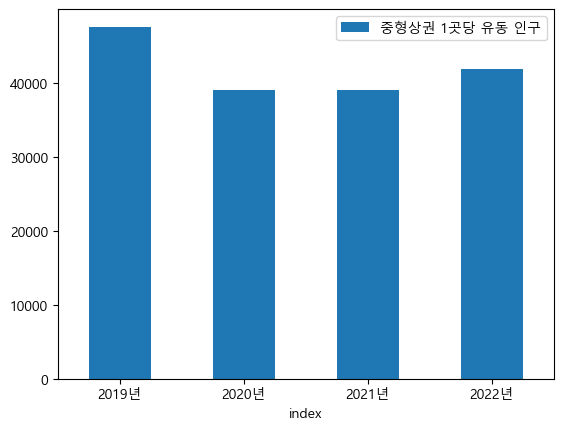

In [34]:
market_count.plot.bar(x='index',y='중형상권 1곳당 유동 인구',rot=0)

### 중형상권이상 1곳당 유동인구는 2020년 낮아졌다가 조금씩 상승하고 있다.

# 이제 상권별 평균속도 데이터를 가져오자

In [35]:
road_2022 = pd.read_csv('./2022_10_자동차_평균속도_위치데이터.csv', encoding='EUC-KR')
road_2021 = pd.read_csv('./2021_10_자동차_평균속도_위치데이터.csv', encoding='EUC-KR')
road_2020 = pd.read_csv('./2020_10_자동차_평균속도_위치데이터.csv', encoding='EUC-KR')
road_2019 = pd.read_csv('./2019_10_자동차_평균속도_위치데이터.csv', encoding='EUC-KR')
road_list = [road_2019, road_2020, road_2021, road_2022]

# 주간(시)의 평균 속도를 구하고, 평일을 기준으로 하자
- 출근시간(출근시간 (06~09) 점심시간(11~13)오후시간(14~16) 퇴근시간 (17~20)을 더하고 평균을 내자

In [36]:
for i in range(len(road_list)):
    road_list[i] = road_list[i].fillna(0)
    road_list[i]["주간평균속도"] = (road_list[i]['출근시간 (06~09)'] + road_list[i]['퇴근시간 (17~20)'] + \
                            road_list[i]['점심시간(11~13)'] + road_list[i]['오후시간(14~16)']) / 4
    road_list[i] = road_list[i][['시점명', '종점명', '방향', '주중,주말', '주간평균속도', '시점 경도', '시점 위도', '종점 경도',  '종점 위도']]
    road_list[i] = road_list[i][road_list[i]['주중,주말'].isin(["주중"])]
    road_list[i] = road_list[i].reset_index()

- market_anual_list = []
- most_big_anual_list = []
- big_anual_list = []
- middle_anual_list = []

In [37]:
import numpy as np
from haversine import haversine
from tqdm import tqdm

In [38]:
most_big_anual_list = []
big_anual_list = []
middle_anual_list = []

for i in range(len(market_anual_list)):
    most_big_market_region = market_anual_list[i].loc[(market_anual_list[i]['유동인구'] >= 100000)]
    most_big_market_region = most_big_market_region.loc[(most_big_market_region['분기당_매출_금액']/91) >= 1000000000]
    most_big_market_region["상권규모"] = "특대형상권"
    most_big_market_region = most_big_market_region.reset_index()
    most_big_anual_list.append(most_big_market_region)
    
for i in range(len(market_anual_list)):
    big_market_region = market_anual_list[i].loc[(market_anual_list[i]['유동인구'] < 100000)]
    big_market_region =  big_market_region.loc[(big_market_region['분기당_매출_금액']/91) > 1000000000]
    big_market_region["상권규모"] = "대형상권"
    big_market_region = big_market_region.reset_index()
    big_anual_list.append(big_market_region)    

for i in range(len(market_anual_list)):
    middle_market_region = market_anual_list[i].loc[(market_anual_list[i]['유동인구'] < 100000)]
    middle_market_region = middle_market_region.loc[(middle_market_region['분기당_매출_금액']/91) < 1000000000]
    middle_market_region["상권규모"] = "중형상권"
    middle_market_region = middle_market_region.sort_values(by='유동인구', ascending=False)
    middle_market_region = middle_market_region.head(100-len(most_big_anual_list[i])-len(big_anual_list[i])) 
    middle_market_region = middle_market_region.reset_index()
    middle_anual_list.append(middle_market_region)

In [39]:
for i in range(len(market_anual_list)):
    most_big_anual_list[i]["상권의 도로 평균 속도"] = 0.
    big_anual_list[i]["상권의 도로 평균 속도"] = 0.
    middle_anual_list[i]["상권의 도로 평균 속도"] = 0.

In [40]:
def make_poly_line(road_df, each, my_map):
    if road_df['방향'][each] == "상행":
        location_data = [[road_df['시점 위도'][each], road_df['시점 경도'][each]],
                         [road_df['종점 위도'][each], road_df['종점 경도'][each]]]
        b = haversine([road_df['시점 위도'][each], road_df['시점 경도'][each]],
                      [road_df['종점 위도'][each], road_df['종점 경도'][each]], unit = 'm')
            
    if road_2022['방향'][each] == "하행":
        location_data = [[float(road_df['시점 위도'][each])+0.0001, float(road_df['시점 경도'][each]+0.0006)],
                        [float(road_df['종점 위도'][each])+0.0001, float(road_df['종점 경도'][each])+0.0006]]
                
        b = haversine([float(road_df['시점 위도'][each])+0.0001, float(road_df['시점 경도'][each])+0.0006], 
                    [float(road_df['종점 위도'][each])+0.0001, float(road_df['종점 경도'][each])+0.0006], unit = 'm')

        if b < 5500:
                if road_df['주간평균속도'][each] >= 25:
                    folium.PolyLine(locations=location_data, tooltip='Polyline', color='green').add_to(my_map)

                elif road_df['주간평균속도'][each] > 15:
                    folium.PolyLine(locations=location_data, tooltip='Polyline', color="yellow").add_to(my_map)

                else:
                    folium.PolyLine(locations=location_data, tooltip='Polyline', color='red').add_to(my_map)


In [41]:
def make_road(market_degree, road_data, my_map):
    for i in range(len(market_degree)):
        road_count = 0
        market_region_location =  (market_degree['lat'][i], market_degree['long'][i])

        for each in range(len(road_data)):

            road_location = (road_data['시점 위도'][each], road_data['시점 경도'][each])
            a = haversine(road_location, market_region_location, unit = 'm')
            if a < 500:
                road_count = road_count + 1
                    
                market_degree['상권의 도로 평균 속도'][i] = market_degree['상권의 도로 평균 속도'][i] +\
                                                                                road_data['주간평균속도'][each]

                make_poly_line(road_data, each, my_map)


            road_location = (road_data['종점 위도'][each], road_data['종점 경도'][each])
            a = haversine(road_location, market_region_location, unit = 'm') 
            if a < 500:
                road_count = road_count + 1
                market_degree['상권의 도로 평균 속도'][i] = market_degree['상권의 도로 평균 속도'][i] +\
                                                                                road_data['주간평균속도'][each] 
                
                make_poly_line(road_data, each, my_map)


        market_degree["상권의 도로 평균 속도"][i] = market_degree['상권의 도로 평균 속도'][i] / road_count

In [42]:
my_map_road_2019 = folium.Map(location=[37.5502, 126.982], zoom_start=11, title="Stamen Toner")
my_map_road_2020 = folium.Map(location=[37.5502, 126.982], zoom_start=11, title="Stamen Toner")
my_map_road_2021 = folium.Map(location=[37.5502, 126.982], zoom_start=11, title="Stamen Toner")
my_map_road_2022 = folium.Map(location=[37.5502, 126.982], zoom_start=11, title="Stamen Toner")
map_road_list = [my_map_road_2019, my_map_road_2020, my_map_road_2021, my_map_road_2022]

In [43]:
for i in range(4):
    gu_line(map_road_list[i])
    make_road(most_big_anual_list[i], road_list[i], map_road_list[i])
    make_road(big_anual_list[i], road_list[i], map_road_list[i])
    make_road(middle_anual_list[i], road_list[i], map_road_list[i])
    make_market_region(most_big_anual_list[i], big_anual_list[i], middle_anual_list[i], map_road_list[i])

C:\python\envs\opencv\lib\site-packages\folium\folium.py:407: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  warnings.warn(
C:\Users\김두엽\AppData\Local\Temp\ipykernel_20684\1834461262.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  market_degree['상권의 도로 평균 속도'][i] = market_degree['상권의 도로 평균 속도'][i] +\
C:\Users\김두엽\AppData\Local\Temp\ipykernel_20684\1834461262.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  market_degree['상권의 도로 평균 속도'][i] = market_degree['상권의 도

22.105000000000004
22.105000000000004
45.470000000000006
62.84250000000001
62.84250000000001
75.58500000000001
88.32750000000001
88.32750000000001
100.60250000000002
112.87750000000003
130.70750000000004
130.70750000000004
157.85000000000005
157.85000000000005
180.28750000000005
202.72500000000005
202.72500000000005
228.54500000000004
254.36500000000004
254.36500000000004
274.595
274.595
290.19000000000005
305.7850000000001
305.7850000000001
333.05250000000007
360.32000000000005
360.32000000000005
375.19500000000005
386.37000000000006
401.9025000000001
441.23500000000007
484.50750000000005
484.50750000000005
516.3975
516.3975
555.1025000000001
555.1025000000001
584.85
584.85
617.135
632.845
632.845
641.955
674.5150000000001
674.5150000000001
685.7700000000001
697.0250000000001
697.0250000000001
726.9175000000001
756.8100000000002
756.8100000000002
776.8275000000002
796.8450000000003
796.8450000000003
821.2400000000002
833.0450000000002
833.0450000000002
874.8100000000002
874.8100000000

0.0
30.025
30.025
41.5575
66.22
82.55
82.55
92.36749999999999
102.18499999999999
102.18499999999999
118.1
118.1
132.9675
147.835
165.9875
165.9875
178.3925
190.7975
211.9225
211.9225
230.3
260.27750000000003
260.27750000000003
282.51750000000004
282.51750000000004
304.07500000000005
326.25500000000005
347.11500000000007
347.11500000000007
361.44750000000005
361.44750000000005
382.83250000000004
404.21750000000003
404.21750000000003
429.08250000000004
453.94750000000005
453.94750000000005
474.9775000000001
492.4725000000001
511.1450000000001
511.1450000000001
528.3975
528.3975
546.9175
565.4375
565.4375
587.5
609.5625
609.5625
625.36
625.36
642.885
657.2825
657.2825
695.84
695.84
718.5875000000001
741.4175000000001
755.2700000000001
770.1275
770.1275
785.7175000000001
785.7175000000001
804.1125000000001
822.5075
822.5075
837.8000000000001
853.0925000000001
853.0925000000001
868.1600000000001
881.1925000000001
897.1300000000001
914.1025000000001
914.1025000000001여기다가 49나누면
18.65515306122

106.9075
132.25
132.25
157.6175
157.6175
179.49
179.49여기다가 8나누면
22.43625
20.28
39.4
39.4
61.2
61.2
80.2975
99.525
116.94250000000001
139.085
139.085
168.9925
168.9925
185.84
212.45
239.4175
239.4175
264.76
290.10249999999996
290.10249999999996
311.98999999999995
333.87749999999994
333.87749999999994
359.24499999999995
359.24499999999995
381.11749999999995
402.98999999999995
402.98999999999995
426.87499999999994
426.87499999999994
445.56249999999994
464.24999999999994
464.24999999999994
483.81749999999994
503.38499999999993
503.38499999999993
536.6924999999999
536.6924999999999
565.6774999999999
594.6624999999999
594.6624999999999
608.0074999999999
633.9699999999999
651.5749999999999
651.5749999999999
676.4524999999999
691.1674999999999
691.1674999999999여기다가 31나누면
22.29572580645161
0.0
27.705
47.9075
79.97999999999999
79.97999999999999
102.2575
102.2575
117.835
145.3175
145.3175
168.6325
191.9475
191.9475
215.2175
215.2175
236.23250000000002
257.2475
280.09250000000003
309.2600000000000

531.005여기다가 20나누면
26.55025
17.372500000000002
30.115000000000002
42.39
42.39
60.22
78.05
78.05
105.1925
105.1925
127.63
127.63
153.45
153.45
173.67999999999998
193.90999999999997
209.50499999999997
209.50499999999997
236.77249999999998
236.77249999999998
242.96249999999998
258.495
297.8275
341.09999999999997
341.09999999999997
372.98999999999995
372.98999999999995
411.69499999999994
411.69499999999994
441.44249999999994
441.44249999999994
473.72749999999996
489.43749999999994
489.43749999999994
498.54749999999996
513.165
513.165
540.2375
540.2375
556.8449999999999
573.4524999999999
573.4524999999999
589.9224999999999
606.3924999999999
606.3924999999999
615.4424999999999
624.4924999999998
624.4924999999998
639.1249999999999
661.4949999999999
661.4949999999999
683.3349999999999
683.3349999999999
695.0724999999999
706.8099999999998
706.8099999999998
715.8374999999999
724.8649999999999
724.8649999999999
744.6774999999999
764.4899999999999
780.1899999999999
780.1899999999999
799.1025
818.01

16.3925
16.3925
33.7325
51.072500000000005
51.072500000000005
61.17750000000001
61.17750000000001
70.995
80.8125
95.4875
109.7325
109.7325
130.41
130.41
142.4525
154.43499999999997
154.43499999999997
166.96249999999998
182.53749999999997
196.14749999999998
196.14749999999998
216.75499999999997
216.75499999999997
236.62999999999997
252.69499999999996
252.69499999999996
272.74749999999995
272.74749999999995
292.92249999999996
292.92249999999996
309.3924999999999
325.86249999999995
342.30499999999995
361.56999999999994
361.56999999999994
376.2049999999999
390.8399999999999
390.8399999999999
407.0349999999999
407.0349999999999
431.7999999999999
431.7999999999999
442.7349999999999
453.6699999999999
473.8074999999999
473.8074999999999
491.3474999999999
508.88749999999993
508.88749999999993
517.1025
525.3175
541.0575
541.0575
554.3775
567.6975000000001
567.6975000000001
581.2200000000001
581.2200000000001
588.6850000000002
596.1500000000002
596.1500000000002
619.6825000000002
643.215000000000

83.98499999999999
99.69999999999999
99.69999999999999
124.32999999999998
143.58749999999998
160.2925
160.2925여기다가 8나누면
20.0365625
18.125
18.125
36.9825
55.84
55.84
75.4625
95.08500000000001
95.08500000000001
117.80000000000001
140.51500000000001
140.51500000000001
163.59500000000003
163.59500000000003
182.91000000000003
182.91000000000003
208.02250000000004
233.13500000000005
248.50000000000006
248.50000000000006
271.49250000000006
271.49250000000006
288.01750000000004
307.63000000000005
322.82000000000005
345.96750000000003
345.96750000000003
365.2875
365.2875
385.6725
406.65500000000003
426.88750000000005
426.88750000000005
445.74000000000007
445.74000000000007
462.6700000000001
479.6525000000001
492.9350000000001
492.9350000000001
513.0950000000001
533.2550000000001
533.2550000000001
551.0075000000002
551.0075000000002
571.8025000000001
571.8025000000001
595.0925000000001
618.3825
636.12
636.12여기다가 32나누면
19.87875
0.0
17.830000000000002
38.06
38.06
44.25
50.44
50.44
68.95
84.4825
123

848.3375000000002여기다가 40나누면
21.208437500000006
0.0
29.45
29.45
54.65
79.85
102.05
124.8075
124.8075
147.76
170.71249999999998
170.71249999999998
187.70499999999998
240.86249999999998
240.86249999999998
314.72749999999996
314.72749999999996
383.78
461.13
520.9975
520.9975
598.3475
598.3475
637.53
698.505
698.505
718.0625
718.0625
736.5375
755.0125
779.5175
779.5175
799.2875
819.0575
819.0575
837.4525
857.75
857.75
876.3925
895.0350000000001
895.0350000000001
916.1675000000001
937.3000000000002
937.3000000000002
959.0550000000002
974.9375000000002
1003.0850000000003
1003.0850000000003
1022.6650000000003
1022.6650000000003
1040.4125000000004
1058.1600000000003
1070.1550000000002
1070.1550000000002
1094.0750000000003
1117.9950000000003
1117.9950000000003
1143.0375000000004
1175.9200000000003
1175.9200000000003
1199.3725000000004
1199.3725000000004
1225.5125000000005
1257.5975000000005
1257.5975000000005여기다가 42나누면
29.94279761904763
21.525
45.685
45.685
68.4525
68.4525
92.895
127.025
151.797

426.79749999999996
441.2125
454.59999999999997
468.17499999999995
507.4575
546.0775
546.0775
576.61
576.61
613.8075
613.8075
645.2225
645.2225
677.8175
689.3375
689.3375
708.6424999999999
736.4875
736.4875
750.2349999999999
763.9824999999998
763.9824999999998
797.9574999999999
831.9324999999999
831.9324999999999
855.9774999999998
880.0224999999998
880.0224999999998
909.9649999999998
925.6524999999998
925.6524999999998
967.3849999999998
967.3849999999998
993.0624999999998
1018.7399999999998
1034.1674999999998
1034.1674999999998
1065.1999999999998
1089.8899999999999
1113.8049999999998
1113.8049999999998
1134.5224999999998
1134.5224999999998
1161.7924999999998
1161.7924999999998
1182.5624999999998
1203.3324999999998
1221.7674999999997
1250.1924999999997
1250.1924999999997
1269.5474999999997
1269.5474999999997
1287.7999999999997
1306.0524999999998
1306.0524999999998
1329.1574999999998
1352.2624999999998
1352.2624999999998
1365.8374999999999
1379.4125
1379.4125
1403.7224999999999
1428.03249

201.05
201.05
222.3175
222.3175
233.2625
244.20749999999998
244.20749999999998
263.7
283.1925
283.1925
307.6475
332.10249999999996
332.10249999999996
347.0225
361.9425
361.9425
376.7675
391.5925
391.5925
407.85749999999996
424.12249999999995
424.12249999999995
466.13499999999993
503.93999999999994
503.93999999999994
522.925
541.91
562.165
562.165
600.41
600.41
632.0649999999999
663.7199999999999
663.7199999999999
700.92
738.12
738.12
760.94
760.94
782.9425000000001
804.9450000000002
827.2375000000002
827.2375000000002
847.0200000000002
881.3500000000003
909.7750000000002
909.7750000000002
951.7450000000002
951.7450000000002
982.7650000000002
1013.7850000000002
1013.7850000000002
1034.3950000000002
1055.005
1073.2675000000002
1073.2675000000002
1098.045
1098.045
1115.5875
1128.15
1128.15여기다가 44나누면
25.639772727272728
0.0
25.802500000000002
25.802500000000002
45.2275
84.32
117.54499999999999
117.54499999999999
144.81
166.3625
187.57250000000002
187.57250000000002
213.02500000000003
238.47

155.43999999999997여기다가 8나누면
19.429999999999996
30.4075
56.230000000000004
56.230000000000004
74.15
74.15
114.13000000000001
133.77
133.77
150.155
150.155
172.8325
188.5575
188.5575여기다가 8나누면
23.5696875
0.0
17.324999999999996
17.324999999999996
42.26499999999999
62.07249999999999
82.13499999999999
100.52499999999999
117.61999999999999
117.61999999999999
134.06
134.06
147.9275
178.32
206.58249999999998
206.58249999999998
222.17249999999999
222.17249999999999
246.96249999999998
263.96
263.96
281.10749999999996
281.10749999999996
300.74749999999995
319.85999999999996
345.59999999999997
345.59999999999997
361.54249999999996
361.54249999999996
380.68749999999994
404.81249999999994
404.81249999999994여기다가 20나누면
20.240624999999998
24.939999999999998
24.939999999999998
45.0025
45.0025
62.379999999999995
86.6225
106.2625
106.2625
125.375
125.375
142.8725
160.4675
179.6125
197.24
197.24
221.365
221.365
240.5175
240.5175여기다가 12나누면
20.043125
20.0975
20.0975
37.0025
37.0025
57.1275
77.2525
102.0724999

173.4725여기다가 8나누면
21.6840625
30.865000000000002
30.865000000000002
57.86
57.86
72.39
100.93
100.93
124.81750000000001
135.82500000000002
135.82500000000002
157.84000000000003
157.84000000000003
185.71250000000003
207.84500000000003
227.62250000000003
227.62250000000003
246.00750000000002
266.58000000000004
266.58000000000004
287.26750000000004
287.26750000000004
300.56250000000006
314.6600000000001
332.6475000000001
332.6475000000001여기다가 16나누면
20.790468750000006
30.865000000000002
30.865000000000002
57.86
57.86
72.39
100.93
121.5025
121.5025
142.19
142.19
155.48499999999999
173.4725
173.4725여기다가 8나누면
21.6840625
20.9525
20.9525
42.3925
42.3925
65.66
88.9275
106.66749999999999
121.55499999999999
142.0575
142.0575
173.525
204.9925
204.9925
238.1875
238.1875
273.0175
273.0175
293.59999999999997
309.62249999999995
309.62249999999995
337.23999999999995
337.23999999999995
357.2175
370.79249999999996
410.07499999999993
448.69499999999994
448.69499999999994
479.22749999999996
479.22749999999996

688.8349999999999
712.2149999999999
712.2149999999999
734.1924999999999
734.1924999999999
750.8549999999999
767.5174999999999
767.5174999999999
791.2475
791.2475
808.0224999999999
824.7974999999999
845.8949999999999
845.8949999999999
867.9674999999999
867.9674999999999
890.2824999999998
912.5974999999999
912.5974999999999
928.6499999999999
944.7024999999999
944.7024999999999
978.5899999999999
994.4925
994.4925
1010.9875
1027.4824999999998
1027.4824999999998
1052.5399999999997
1052.5399999999997
1075.8224999999998
1099.1049999999998
1099.1049999999998
1121.9999999999998
1139.3649999999998
1160.5174999999997
1177.3349999999998
1177.3349999999998
1191.0275
1191.0275
1209.32
1221.8825
1221.8825여기다가 59나누면
20.70987288135593
31.865
31.865
47.28
47.28
84.94500000000001
131.98000000000002
131.98000000000002
153.11
153.11
168.3675
200.0075
225.8675
225.8675
251.83
284.6825
309.3
329.255
329.255
350.9925
350.9925
377.695
377.695여기다가 14나누면
26.978214285714284
30.865000000000002
30.865000000000002
5

0.0
23.887500000000003
34.895
34.895
56.910000000000004
56.910000000000004
84.7825
106.91499999999999
126.6925
126.6925
145.0775
159.17499999999998
159.17499999999998여기다가 8나누면
19.896874999999998
0.0
21.0875
42.175
42.175
70.335
98.49499999999999
122.64999999999999
122.64999999999999
142.92249999999999
163.195
163.195
183.6025
204.01
204.01
225.1825
246.35500000000002
246.35500000000002
271.2275
292.7525
292.7525
316.02
339.28749999999997
339.28749999999997
359.57
377.6475
377.6475
398.8975
398.8975
415.66249999999997
432.42749999999995
432.42749999999995
450.4575
468.48749999999995
468.48749999999995
487.66249999999997
504.55249999999995
504.55249999999995
523.9525
523.9525
537.0975
558.355
572.6925
572.6925
591.785
610.8774999999999
610.8774999999999
627.635
644.3925
644.3925
674.765
705.1374999999999
705.1374999999999
730.685
730.685
754.0749999999999
777.4649999999999
799.1199999999999
799.1199999999999여기다가 38나누면
21.029473684210522
15.825
15.825
32.235
48.644999999999996
48.64499999

0.0
17.2975
17.2975
34.3475
51.397499999999994
67.8325
67.8325
84.8975
101.96249999999999
101.96249999999999
119.01749999999998
133.635
165.5
165.5
180.915
200.77249999999998
200.77249999999998
223.255
223.255
239.2475
254.2175
254.2175
291.8825
338.9175
338.9175
360.0475
381.1775
381.1775
396.435
396.435
428.075
459.715
459.715
485.9425
502.77
528.63
528.63
554.5925
587.4449999999999
587.4449999999999여기다가 26나누면
22.59403846153846
19.895
19.895
39.9725
60.05
60.05
79.69749999999999
99.345
99.345
122.7675
146.19
146.19
169.5575
169.5575
188.9725
188.9725
211.2625
233.55249999999998
250.6275
250.6275
272.5675
272.5675
292.85
314.5375
328.185
350.4925
350.4925
371.2075
371.2075
391.95
414.495
432.2825
432.2825
453.345
453.345
469.6725
487.485
501.9975
501.9975
521.2025
540.4075
540.4075
559.1775
559.1775
581.1625
581.1625
603.7875
626.4125
646.8975
646.8975여기다가 32나누면
20.215546875
0.0
23.805
47.61
47.61
69.9875
90.1
110.17999999999999
110.17999999999999
126.29499999999999
126.29499999999999

107.08
107.08
123.7225
140.365
140.365
159.935
159.935
184.1875
208.44
228.3125
228.3125
250.3775
250.3775
271.8175
271.8175
289.475
307.13250000000005
323.0325
342.32000000000005
342.32000000000005
357.9200000000001
373.5200000000001
373.5200000000001
390.0950000000001
390.0950000000001
411.18750000000006
411.18750000000006
426.8500000000001
442.5125000000001
457.2100000000001
457.2100000000001
476.0050000000001
494.8000000000001
494.8000000000001
504.5075000000001
514.2150000000001
535.9300000000002
551.7625000000002
551.7625000000002
567.0550000000002
582.3475000000002
582.3475000000002
598.6025000000002
598.6025000000002
607.3075000000002
616.0125000000003
616.0125000000003
637.0875000000003
647.4100000000003
666.3250000000003
666.3250000000003
682.1650000000003
682.1650000000003
700.8950000000003
700.8950000000003여기다가 42나누면
16.6879761904762
0.0
18.015
31.885
31.885
51.52250000000001
70.04750000000001
70.04750000000001
87.83000000000001
105.61250000000001
105.61250000000001
120.507

274.7475
274.7475
297.1075
297.1075
319.33000000000004
341.9075
364.6175
364.6175
380.41
380.41
401.32750000000004
422.24500000000006
422.24500000000006
446.5400000000001
470.8350000000001
470.8350000000001
494.2500000000001
512.7050000000002
533.3700000000001
533.3700000000001
557.7025000000001
557.7025000000001
573.7975000000001
589.8925000000002
589.8925000000002
615.1000000000001
640.3075000000001
640.3075000000001
656.7775000000001
656.7775000000001
675.8700000000001
688.5550000000001
688.5550000000001
724.8075000000001
724.8075000000001
746.1625000000001
770.5175000000002
784.6000000000001
799.0525000000001
799.0525000000001
816.6350000000001
816.6350000000001
833.4650000000001
850.2950000000002
850.2950000000002
867.6825000000002
885.0700000000003
885.0700000000003
900.1850000000003
912.1800000000003
928.2475000000003
944.6400000000003
944.6400000000003여기다가 49나누면
19.278367346938783
21.1125
39.9075
39.9075
63.075
63.075
81.4975
105.20750000000001
105.20750000000001
127.0925000000

183.5175
183.5175
200.235
216.95250000000001
216.95250000000001
236.58
236.58
256.735
276.89
295.07
295.07
314.04
340.7825
340.7825
362.83500000000004
373.4075
373.4075
385.07000000000005
409.65000000000003
409.65000000000003
434.6725
434.6725
450.93
467.1875
467.1875
484.175
501.1625
501.1625
525.6875
544.8825
562.2975
562.2975
584.1625
584.1625
595.1175000000001
612.2225000000001
612.2225000000001
627.3925
642.5625
642.5625
653.4725
664.3824999999999
664.3824999999999
695.0224999999999
725.6624999999999
725.6624999999999
742.5524999999999
759.4424999999999
759.4424999999999
774.0574999999999
788.6724999999999
788.6724999999999
807.9774999999998
807.9774999999998
837.6974999999999
867.4174999999999
889.2349999999999
889.2349999999999여기다가 46나누면
19.33119565217391
23.442500000000003
23.442500000000003
43.1325
62.8225
62.8225
90.645
90.645
116.86
143.075
170.14499999999998
170.14499999999998
185.8525
185.8525
207.99249999999998
234.02749999999997
234.02749999999997
253.14
272.2525
272.252

381.9699999999999여기다가 22나누면
17.362272727272725
0.0
26.035000000000004
26.035000000000004
36.7075
63.1425
78.3375
78.3375
91.34
104.3425
104.3425
125.49000000000001
125.49000000000001
138.42000000000002
151.35000000000002
171.90250000000003
171.90250000000003
188.87750000000003
205.85250000000002
227.17000000000002
227.17000000000002
243.85500000000002
274.7475
274.7475
297.1075
297.1075
319.33000000000004
341.9075
364.6175
364.6175
380.41
380.41
401.32750000000004
422.24500000000006
422.24500000000006
446.5400000000001
470.8350000000001
470.8350000000001
494.2500000000001
512.7050000000002
533.3700000000001
533.3700000000001
557.7025000000001
557.7025000000001
573.7975000000001
589.8925000000002
589.8925000000002
615.1000000000001
640.3075000000001
640.3075000000001
656.7775000000001
656.7775000000001
675.8700000000001
694.9625000000001
707.6475
707.6475
743.9000000000001
743.9000000000001
765.2550000000001
789.6100000000001
789.6100000000001
803.6925000000001
817.7750000000001
817.775

184.8125
184.8125
206.075
206.075
219.1225
237.7375
237.7375여기다가 12나누면
19.811458333333334
34.027499999999996
34.027499999999996
68.965
68.965
106.34
139.0325
139.0325
170.9025
170.9025
211.4625
254.79500000000002
271.5975
271.5975
300.02750000000003
320.88500000000005
320.88500000000005
338.71000000000004
356.535
376.1075
376.1075
396.40500000000003
416.70250000000004
416.70250000000004
430.67250000000007
430.67250000000007
451.12000000000006
469.04750000000007
469.04750000000007
485.31000000000006
485.31000000000006
497.4100000000001
509.5100000000001
509.5100000000001
533.1450000000001
533.1450000000001
553.0950000000001
573.0450000000002
588.8900000000002
607.2125000000002
607.2125000000002
621.0925000000002
634.9725000000002
634.9725000000002
658.1600000000002
681.3475000000002
695.7650000000002
695.7650000000002
712.1200000000002
712.1200000000002
727.5350000000002
742.9500000000002
742.9500000000002
755.5975000000002
768.2450000000002
768.2450000000002여기다가 36나누면
21.34013888888889

644.05
644.05
689.9375
710.9
710.9
725.7425
725.7425
758.4549999999999
791.1674999999999
791.1674999999999
817.54
843.9124999999999
843.9124999999999
874.805
874.805
889.9375
905.07
905.07
929.3950000000001
953.7200000000001
976.0800000000002
991.3425000000002
991.3425000000002
1011.9825000000002
1011.9825000000002
1034.6925
1050.4850000000001
1069.5775
1069.5775
1083.66
1083.66
1098.1125000000002
1115.6950000000002
1134.0750000000003
1134.0750000000003
1150.4675000000002
1150.4675000000002여기다가 56나누면
20.544062500000003
34.027499999999996
34.027499999999996
68.965
68.965
106.34
139.0325
161.5625
161.5625
178.24
197.1275
197.1275
215.2275
215.2275
247.0975
247.0975
287.6575
330.99
347.7925
365.6175
385.19
385.19
405.4875
405.4875
419.45750000000004
438.71750000000003
438.71750000000003
458.93
458.93
481.2625
503.375
517.7925
517.7925
534.1475
534.1475
549.5625
562.21
562.21여기다가 24나누면
23.425416666666667
12.305000000000001
12.305000000000001
28.252499999999998
44.199999999999996
44.1999999

88.67750000000001
107.51500000000001
107.51500000000001
123.42500000000001
123.42500000000001
142.62
142.62여기다가 7나누면
20.374285714285715
15.525
15.525
44.6375
72.1975
72.1975
100.8425
100.8425
142.685
180.3975
180.3975
196.60250000000002
211.08
211.08여기다가 8나누면
26.385
0.0
16.47
36.8925
36.8925
53.4025
62.667500000000004
75.28
90.315
90.315
113.7725
113.7725
130.295
130.295
151.49749999999997
172.69999999999996
172.69999999999996
185.86749999999995
185.86749999999995
202.14999999999995
218.43249999999995
238.73249999999996
238.73249999999996
252.76249999999996
266.79249999999996
266.79249999999996
282.215
297.6375
313.1475
313.1475
328.195
343.2425
343.2425
362.71
362.71
386.67499999999995
410.63999999999993
410.63999999999993
435.0374999999999
459.4349999999999
459.4349999999999
487.2599999999999
487.2599999999999
506.2499999999999
525.2399999999999
525.2399999999999
539.9824999999998
554.7249999999998
575.6299999999998
575.6299999999998
595.1374999999998
614.6449999999999
614.6449999999

0.0
25.729999999999997
25.729999999999997
46.162499999999994
66.595
86.78999999999999
86.78999999999999
101.475
116.16
116.16
131.215
152.6925
152.6925
173.5375
187.0425
200.2175
213.7975
213.7975
231.09750000000003
231.09750000000003
244.27750000000003
244.27750000000003
260.72
277.1625
277.1625
300.0675
300.0675
315.8275
331.5875
331.5875
356.10499999999996
367.44249999999994
381.9699999999999
381.9699999999999여기다가 22나누면
17.362272727272725
19.0125
19.0125
37.272499999999994
67.94999999999999
67.94999999999999
82.41999999999999
82.41999999999999
100.79999999999998
119.17999999999998
119.17999999999998
150.45999999999998
181.73999999999998
181.73999999999998
210.15249999999997
227.03499999999997
227.03499999999997
251.37749999999997
275.71999999999997
275.71999999999997
297.8375
319.955
319.955
338.515
357.075
357.075
382.6475
407.78499999999997
407.78499999999997
422.29999999999995
436.81499999999994
436.81499999999994
458.86999999999995
478.17249999999996
478.17249999999996여기다가 22나누면

74.63499999999999
74.63499999999999
96.19999999999999
96.19999999999999
117.7225
117.7225
135.305
150.6475
165.2225
165.2225
185.13
185.13
200.5675
216.005
230.185
230.185
248.69
267.195
267.195
276.455
285.715
301.80249999999995
301.80249999999995
318.67749999999995
335.55249999999995
335.55249999999995
352.34999999999997
352.34999999999997
362.71
373.07
373.07
395.17
417.27000000000004
417.27000000000004
428.02500000000003
438.78000000000003
438.78000000000003
457.5425
477.875
477.875여기다가 30나누면
15.929166666666667
15.895000000000001
15.895000000000001
32.405
48.915000000000006
48.915000000000006
59.75750000000001
59.75750000000001
69.02250000000001
78.28750000000001
99.49000000000001
112.65750000000001
112.65750000000001
128.94
144.6575
144.6575
164.9575
164.9575
177.95250000000001
191.98250000000002
191.98250000000002
207.40500000000003
222.91500000000002
237.96250000000003
237.96250000000003
257.43
257.43
281.395
296.1375
296.1375
315.645
335.0525
335.0525
356.6175
356.6175
378.14
3

0.0
16.6325
30.442500000000003
49.28
49.28
75.985
75.985
100.8775
118.1525
145.745
171.72750000000002
171.72750000000002
188.08750000000003
188.08750000000003
216.36250000000004
216.36250000000004
246.25250000000005
276.14250000000004
276.14250000000004
298.96250000000003
298.96250000000003
313.08000000000004
327.19750000000005
327.19750000000005
348.12750000000005
369.63750000000005
383.40000000000003
383.40000000000003
411.02250000000004
411.02250000000004
427.9875
445.15500000000003
460.00750000000005
460.00750000000005여기다가 22나누면
20.90943181818182
0.0
27.8575
27.8575
38.09
60.525000000000006
75.4825
96.6725
96.6725
112.17
129.7475
129.7475
153.75
153.75
165.755
177.76
177.76
192.2475
206.735
206.735
229.1725
251.61
251.61
267.7625
283.91499999999996
283.91499999999996
299.79999999999995
318.80999999999995
318.80999999999995
339.1449999999999
359.4799999999999
359.4799999999999
372.0974999999999
372.0974999999999
387.1599999999999
402.2224999999999
422.2249999999999
422.2249999999999

152.655
178.20499999999998
198.33249999999998
218.17499999999998
218.17499999999998
242.64999999999998
267.125
267.125
292.325
292.325
318.6125
318.6125
339.77
360.9275
382.95
382.95여기다가 16나누면
23.934375
0.0
22.54
41.3925
60.4475
60.4475
80.0
80.0
97.10499999999999
114.20999999999998
114.20999999999998
135.58749999999998
156.96499999999997
165.89249999999998
191.315
191.315
204.085
204.085
216.43
228.775
228.775
251.51250000000002
251.51250000000002
260.995
270.4775
270.4775여기다가 16나누면
16.90484375
0.0
25.37
25.37
46.61
67.1275
82.41
82.41
98.4875
98.4875
122.175
141.51
157.285
157.285여기다가 8나누면
19.660625
21.5175
21.5175
40.5125
40.5125
69.3575
98.2025
98.2025
115.25
115.25
137.245
159.24
159.24
179.6775
200.115
217.86
217.86
244.11
270.36
270.36
287.2825
300.3525
300.3525
325.93
351.5075
351.5075
372.03249999999997
372.03249999999997
390.30499999999995
408.57749999999993
408.57749999999993
431.5274999999999
454.4774999999999
476.1649999999999
476.1649999999999
506.1874999999999
536.209999

358.1875
395.3675
395.3675
429.175
460.64
486.8025
486.8025여기다가 20나누면
24.340125
20.0775
44.2425
44.2425
68.4375
68.4375
89.555
111.1275
111.1275
150.625
150.625
178.57999999999998
193.31249999999997
206.77749999999997
227.03249999999997
227.03249999999997
246.88249999999996
246.88249999999996여기다가 11나누면
22.443863636363634
13.2175
13.2175
33.2475
53.2775
53.2775
83.6525
83.6525
102.26750000000001
120.88250000000002
140.25500000000002
140.25500000000002
159.07500000000002
159.07500000000002
179.32500000000002
204.6725
204.6725
216.995
216.995
237.4425
257.89
271.8725
271.8725
295.0975
295.0975
316.64250000000004
338.18750000000006
338.18750000000006
373.4825000000001
408.7775000000001
408.7775000000001
422.7550000000001
436.73250000000013
436.73250000000013
458.33000000000015
479.9275000000002
479.9275000000002
508.81250000000017
508.81250000000017
531.1050000000001
553.3975000000002
577.9625000000002
577.9625000000002
592.5900000000003
614.8475000000003
632.4575000000003
651.875000000000

362.13250000000016
362.13250000000016
376.9825000000002
391.8325000000002
391.8325000000002
410.6875000000002
410.6875000000002
433.0000000000002
455.3125000000002
455.3125000000002
478.68250000000023
502.05250000000024
502.05250000000024
529.2125000000002
529.2125000000002
548.1650000000002
567.1175000000002
567.1175000000002
584.4925000000002
601.8675000000002
621.9525000000002
621.9525000000002
641.0125000000002
660.0725000000001
660.0725000000001
679.45
698.8275000000001
698.8275000000001
716.4325000000001
734.0375000000001
754.0375000000001
754.0375000000001
780.7075000000001
780.7075000000001
799.8625000000001
819.0175
819.0175
841.9625000000001
864.9075000000001
882.8800000000001
904.7775000000001
904.7775000000001
920.0825000000001
920.0825000000001
935.7225000000001
950.0425000000001
950.0425000000001
968.7775000000001
968.7775000000001
978.1500000000001
987.5225
1008.0475
1023.2475000000001
1023.2475000000001
1039.4825
1055.7175
1055.7175
1071.305
1071.305
1081.49
1091.675
10

315.7625여기다가 14나누면
22.554464285714285
19.3825
32.4275
45.645
45.645
65.67500000000001
85.70500000000001
85.70500000000001
114.88750000000002
114.88750000000002
143.90750000000003
143.90750000000003
174.28250000000003
174.28250000000003
192.89750000000004
211.51250000000005
225.72500000000005
225.72500000000005
253.33500000000004
253.33500000000004
258.90500000000003
273.125
308.5475
308.5475
335.9175
335.9175
366.6125
366.6125
398.3725
410.3925
410.3925
424.075
434.74
434.74
462.065
462.065
478.335
494.60499999999996
494.60499999999996
521.25
547.895
547.895
559.9825
572.0699999999999
572.0699999999999
588.4499999999999
607.8225
607.8225
626.6425
626.6425
646.8925
667.1425
667.1425
688.8975
710.6525
710.6525
736.0
761.3475
781.9475
781.9475
800.7375
819.5274999999999
831.8499999999999
831.8499999999999
859.6274999999999
887.405
887.405
900.795
914.185
914.185
931.43
948.675
948.675
969.8249999999999
990.9749999999999
990.9749999999999
1004.9574999999999
1018.9399999999998
1018.93999999

325.1775000000001
340.02750000000015
340.02750000000015
358.88250000000016
358.88250000000016
381.19500000000016
398.57000000000016
398.57000000000016
417.63000000000017
417.63000000000017
437.00750000000016
454.6125000000002
473.76750000000015
473.76750000000015
496.71250000000015
514.6850000000002
536.5825000000002
536.5825000000002
551.8875000000002
551.8875000000002
567.5275000000001
581.8475000000002
581.8475000000002
600.5825000000002
600.5825000000002
609.9550000000002
619.3275000000001
634.5275000000001
634.5275000000001
650.7625000000002
666.9975000000002
666.9975000000002
682.5850000000002
682.5850000000002
692.7700000000001
702.955
702.955
726.4050000000001
749.8550000000001
749.8550000000001
760.1700000000002
770.4850000000002
770.4850000000002
788.8000000000003
808.6775000000004
835.3250000000004
866.5200000000004
866.5200000000004
888.0825000000004
888.0825000000004
901.5150000000004
901.5150000000004여기다가 54나누면
16.69472222222223
0.0
25.395
25.395
45.894999999999996
66.395

191.3775
206.2275
206.2275
225.08249999999998
225.08249999999998
247.39499999999998
266.54999999999995
266.54999999999995
289.49499999999995
289.49499999999995
311.84749999999997
311.84749999999997
329.82
347.7925
363.96500000000003
385.8625
385.8625
401.1675
416.4725
416.4725
432.1125
432.1125
452.58750000000003
452.58750000000003
466.9075
481.2275
495.9275
495.9275
514.6625
533.3975
533.3975
542.77
552.1424999999999
567.3425
567.3425
583.5775
599.8125
599.8125
615.4
615.4
625.5849999999999
635.7699999999999
635.7699999999999
659.2199999999999
682.67
682.67
692.985
703.3000000000001
703.3000000000001
721.6150000000001
741.4925000000002
741.4925000000002여기다가 46나누면
16.11940217391305
0.0
20.94
20.94
39.735
58.53
78.9125
78.9125
96.5325
114.1525
142.405
180.9975
180.9975
231.295
231.295
251.69
272.085
272.085
284.30249999999995
284.30249999999995
309.86999999999995
335.43749999999994
354.6424999999999
354.6424999999999
370.8474999999999
387.0524999999999
387.0524999999999
411.844999999999

In [52]:
map_road_list[0]

In [53]:
map_road_list[1]

In [54]:
map_road_list[2]

In [55]:
map_road_list[3]

In [48]:
most_big_anual_list[3]

,index,상권_코드_명,점포_수,분기당_매출_금액,분기당_매출_건수,long,lat,유동인구,환승가능한버스노선,500m 버스정류장,환승가능지하철,500m 지하철역,상권규모,상권의 도로 평균 속도
0,1,명동 남대문 북창동 다동 무교동 관광특구,8228,414295939101,15035663,126.981856,37.564149,111583.354839,9.157895,19,1.5,2,특대형상권,21.957649
1,345,종각역,2108,129766749443,4925993,126.983496,37.570339,100588.774194,7.913043,23,1.0,2,특대형상권,15.974563
2,455,고속터미널(고속터미널역),1015,99322681540,3617885,127.003981,37.505008,100292.580645,3.875000,16,3.0,2,특대형상권,20.909432
3,522,평화시장(통일상가 동화상가),1958,106968434038,3254288,127.005863,37.568772,103006.274194,6.130435,23,2.0,2,특대형상권,18.685843


- most_big_anual_list
- big_anual_list
- middle_anual_list 

In [49]:
year_list = [2019, 2020, 2021, 2022]

for i in range(4):
    most_big_anual_list[i]["연도"] = year_list[i] 
    big_anual_list[i]["연도"] = year_list[i]
    middle_anual_list[i]["연도"] = year_list[i]

In [50]:
most_big_traffic = pd.concat([most_big_anual_list[0],
                             most_big_anual_list[1],
                             most_big_anual_list[2],
                             most_big_anual_list[3]])

big_traffic = pd.concat([big_anual_list[0],
                        big_anual_list[1],
                        big_anual_list[2],
                        big_anual_list[3]])

middle_traffic = pd.concat([middle_anual_list[0],
                        middle_anual_list[1],
                        middle_anual_list[2],
                        middle_anual_list[3]])

In [51]:
most_big_traffic.to_csv('./특대형상권 2019~2022년 통계.csv', index=False)
big_traffic.to_csv('./대형상권 2019~2022년 통계.csv', index=False)
middle_traffic.to_csv('./중형상권 2019~2022년 통계.csv', index=False)